# Source, Original notebook
 - https://github.com/acids-ircam/diffusion_models
 - https://github.com/jskim0406/diffusion_models/blob/main/diffusion_01_score.ipynb

# Diffusion probabilistic models - Score matching

#### Author : Philippe Esling (esling@ircam.fr)
- Translator(Korean) : Jeongseob Kim (jeongseob_kim@korea.ac.kr)

본 노트북은 새로운 생성 모델 계열인 _Diffusion Probabilistic Models_ [ [ 1 ] ](#ref1). 해당 모델 계열은 thermodynamics(열역학) [ [ 2 ] ](#ref2)에서 영감을 받아 만들어지게 되었다. 더불어 _denoising score matching_ [ [ 3 ] ](#ref3), _langevin dynamics_ , _autoregressive decoding_ 의 개념과도 강하게 맞물려있다(strong resemblence). 본 노트북에서 최근의 새로운 개선 모델인 _denoising diffusion implicit models_ [ [ 4 ] ](#ref4)을 살펴볼 것이다. 해당 모델은 sampling의 속도를 높이기 위해 Markov chain의 사용을 우회(bypass)한다. 해당 모델[ [ 4 ] ](#ref4)의 연장선 상에서 추가로 _wavegrad_ 모델[ [ 5 ] ](#ref5)을 살펴볼 것이다. [ [ 5 ] ](#ref5)는 diffusion 계열의 핵심 원리에 기반하면서 audio data에 적용한 모델이다.

Diffusion model의 내부 작동원리를 더 잘 이해하기 위해, 본 노트북에선 관련된 모든 topic들을 review할 것이다. 더불어 본 노트북의 세부 항목은 아래와 같다.
   1. Score matching and Langevin dynamics
   2. Diffusion probabilistic models and denoising
   3. Applications to waveforms with WaveGrad
   4. Implicit models to accelerate inference

## Score matching
- 본 파트에서는 diffusion model의 이해에 도움이 될 수 있는 모든 발견사항(all the foundations)들을 살펴볼 것이다. 이를 위해 본 노트북은 _swiss roll_ 이라는 전통적인 데이터셋을 대상으로 진행된다.

### Swiss-roll data

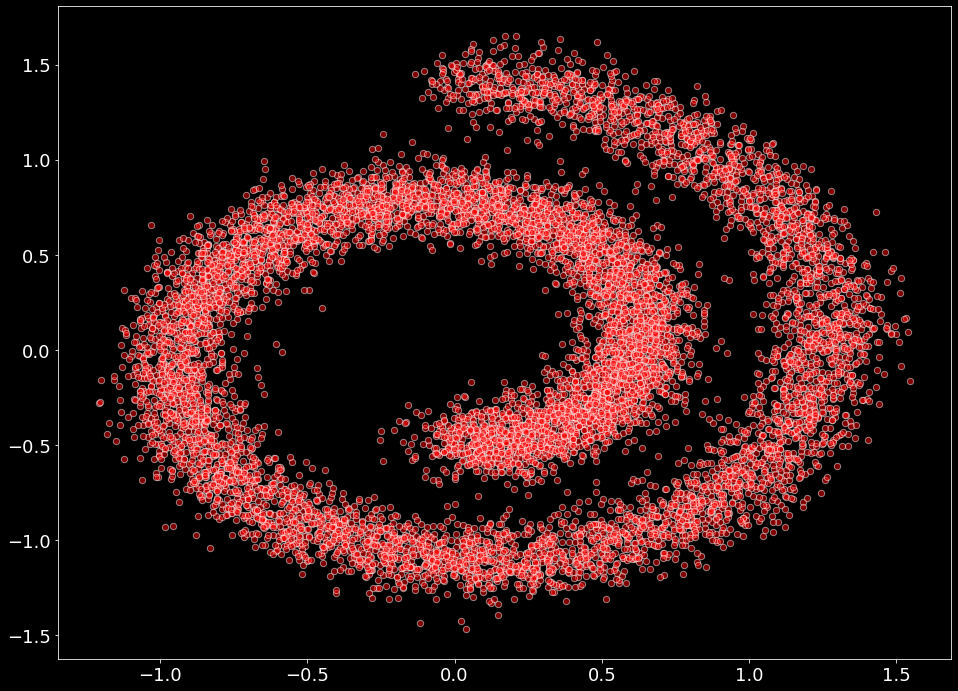

In [36]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_swiss_roll
from helper_plot import hdr_plot_style

hdr_plot_style()
# Sample a batch from the swiss roll
def sample_batch(size, noise=1.0):
    x, _= make_swiss_roll(size, noise=noise)
    return x[:, [0, 2]] / 10.0
# Plot it
data = sample_batch(10**4, noise=1.0).T  # |data| = (2, 10000) = (#features, #samples)
plt.figure(figsize=(16, 12))
plt.scatter(*data, alpha=0.5, color='red', edgecolor='white', s=40)
plt.show()

### What to solve : Objective function

- "MSE" is equal to "Score matching"

- "Score matching" 아이디어는 Hyvarinen et al. [ [ 6 ] ](#ref6)에 의해 제안되었다. 
- "Score matching" 접근에서는 **데이터의 확률(the probability, $\log p(\mathbf{x})$)을 직접적으로(directly)학습하지 않는다.**
    - 대신, 데이터의 **the _gradients_ of $\log p(\mathbf{x})$ w.r.t $x$** 를 학습한다.
        - 여기에서 $\log p(\mathbf{x})$를 **Score**라고 부른다. 
        - the gradients $\nabla_{\mathbf{x}} \log p(\mathbf{x})$ := the _score_ of the density $p(\mathbf{x})$
            - 따라서 이 **Score**를 정확히 맞춰가는 학습을 **Score matching**이라 부른다.
        

- "Score matching"은 결국, 입력 데이터 공간(input space)의 각 data point의 가장 높은 확률 값으로의 방향(_direction of highest probability_)을 학습하는 것과 같다.
    - "즉 단일 가우시안 분포라면, mode의 방향을 학습해가며 찾아가는 것과 같다."


- 하지만 학습하기 위해선, 결국 에러 최소화 문제를 풀도록 디자인 해줘야 한다. 이 경우, 우리의 모델 $\mathcal{F}_{\theta}(\mathbf{x})$와 예측 대상인 gradient $\nabla_{\mathbf{x}} \log p(\mathbf{x})$ 간의 차이(error)를 최소화해주도록 디자인할 필요가 있다.
- 그리고 이를 Fisher divergence를 최소화하는 것으로 정의한다. 간단하게는 MSE와 같은 원리로 이해할 수 있다.

$$ \mathcal{L}_{mse} = E_{\mathbf{x} \sim p(\mathbf{x})} \left[ \left\lVert \mathcal{F}_{\theta}(\mathbf{x}) - \nabla_{\mathbf{x}} \log p(\mathbf{x}) \right\lVert_2^2 \right] $$


- 예측 대상인 gradient(PDF)는 unknown으로, 우리가 알고 싶은 예측 대상이다.
    - $\nabla_{\mathbf{x}} \log p(\mathbf{x})$ : unknown
- 하지만 $p(\mathbf{x})$에 대한 정규화 가정(regularity assumptions on $p(\mathbf{x})$) 하에선, $\mathcal{L}_{mse}$는 아래의 tractable objective를 통해 찾아질 수 있다.

$$ \mathcal{L}_{matching} = E_{\mathbf{x} \sim p(\mathbf{x})} \left[ \text{ tr}\left( \nabla_{\mathbf{x}}  \mathcal{F}_{\theta}(\mathbf{x})  \right) + \frac{1}{2} \left\Vert \mathcal{F}_{\theta}(\mathbf{x}) \right\lVert_2^2 \right]
, $$


- $\nabla_{\mathbf{x}} \mathcal{F}_{\theta}(\mathbf{x})$는 $\mathcal{F}_{\theta}(\mathbf{x})$ with respect to $\mathbf{x}$의 Jacobian을 나타내고, $ \text{tr}(\cdot) $ 는 _trace_ 연산을 의미한다.
    

- 위 objective를 최적화하기 위해, 본 노트북은 ```pytorch```를 기반으로 $\mathcal{F}_{\theta}(\mathbf{x})$를 Neural Network로 정의해 진행할 것이다.

In [31]:
import torch
import torch.nn as nn
import torch.optim as optim

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
print(f"device : {device}")

# define model
model = nn.Sequential(
    nn.Linear(2,128), nn.Softplus(),
    nn.Linear(128,128), nn.Softplus(),
    nn.Linear(128,2)
).to(device)
# define optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-3)

device : cuda:0


Score-matching objective를 표현하기 위한 Loss function을 정의해야 한다.
- 첫째로, Jacobian을 계산하기 위해 differentiable한 특정한 함수를 정의한다.

$$
\mathbf{J}=\left[\begin{array}{ccc}
\frac{\partial \mathbf{f}}{\partial x_{1}} & \cdots & \frac{\partial \mathbf{f}}{\partial x_{n}}
\end{array}\right]=\left[\begin{array}{c}
\nabla^{\mathrm{T}} f_{1} \\
\vdots \\
\nabla^{\mathrm{T}} f_{m}
\end{array}\right]=\left[\begin{array}{ccc}
\frac{\partial f_{1}}{\partial x_{1}} & \cdots & \frac{\partial f_{1}}{\partial x_{n}} \\
\vdots & \ddots & \vdots \\
\frac{\partial f_{m}}{\partial x_{1}} & \cdots & \frac{\partial f_{m}}{\partial x_{n}}
\end{array}\right]
$$

In [32]:
import torch.autograd as autograd

def jacobian(f, x):
    """Computes the Jacobian of f w.r.t x.
    :param f: function R^N -> R^N
    :param x: torch.tensor of shape [B, N]
    :return: Jacobian matrix (torch.tensor) of shape [B, N, N]
    """
    B, N = x.shape
    y = f(x)
    jacobian = list()
    for i in range(N):
        v = torch.zeros_like(y)
        v[:, i] = 1.  # Jacobian에서 df_i/dx를 구하도록 지정하는 역할
        dy_i_dx = autograd.grad(y, x, grad_outputs=v, retain_graph=True, create_graph=True, allow_unused=True)[0]  # shape [B, N]
        jacobian.append(dy_i_dx)
    jacobian = torch.stack(jacobian, dim=2).requires_grad_()
    return jacobian

위에서 언급한 것과 같이, _score matching loss function_ 은 2가지 텀으로 쪼개진다. 

$$ \mathcal{L}_{matching} = E_{\mathbf{x} \sim p(\mathbf{x})} \left[ \text{ tr}\left( \nabla_{\mathbf{x}}  \mathcal{F}_{\theta}(\mathbf{x})  \right) + \frac{1}{2} \left\Vert \mathcal{F}_{\theta}(\mathbf{x}) \right\lVert_2^2 \right]
, $$

- model output의 _Norm_ 인 $\frac{1}{2} \left\Vert \mathcal{F}_{\theta}(\mathbf{x}) \right\lVert_2^2$
- Jacobian loss의 trace연산인 $\text{ tr}\left( \nabla_{\mathbf{x}}  \mathcal{F}_{\theta}(\mathbf{x}) \right)$

우리는 먼저 첫 번째 텀(model output의 Norm)을 계산하고, 이후 두 번째 텀(Jacobian loss의 trace)를 계산할 것이다.

In [33]:
def score_matching(model, samples, train=False):
    samples.requires_grad_(True)
    logp = model(samples) # logp := model output
    
    # Compute the norm loss
    norm_loss = torch.norm(logp, dim=-1) ** 2 / 2.
    
    # Compute the Jacobian loss
    jacob_mat = jacobian(model, samples)
    tr_jacobian_loss = torch.diagonal(jacob_mat, dim1=-2, dim2=-1).sum(-1)
    
    return (tr_jacobian_loss + norm_loss).mean(-1)

마지막으로 지금까지 정리한 코드를 실행해 모델을 학습시킨다.

In [38]:
# |dataset| = (10000, 2) = (#samples, #features)
dataset = torch.tensor(sample_batch(10**4, noise=1.0)).float().to(device) 

for t in range(2000):
    # Compute the loss.
    loss = score_matching(model.to(device), dataset)
    # Before the backward pass, zero all of the network gradients
    optimizer.zero_grad()
    # Backward pass: compute gradient of the loss with respect to parameters
    loss.backward()
    # Calling the step function to update the parameters
    optimizer.step()
    if ((t % 500) == 0):
        print(loss)

tensor(0.6501, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(-10.4412, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(-36.8596, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(-45.8263, device='cuda:0', grad_fn=<MeanBackward1>)


model이 방금 학습한 것은 무엇일까, 우리는 일반적으로 딥러닝을 통해 함수 $f(x)$를 학습한다. 하지만 diffusion의 score matching은 다르다. 

함수 $f(x)$가 아니라, $\nabla_{\mathbf{x}} \log p(\mathbf{x})$로 함수의 gradient이다. 함수가 생성 모델이기 때문에 probability function인 $log p(\mathbf{x})$로 표현될 뿐이다.

우리가 학습한 model($\mathcal{F}_{\theta}(\mathbf{x})$)이 $\nabla_{\mathbf{x}} \log p(\mathbf{x})$ gradient를 잘 학습했는 지 직접 plotting해 살펴보자. 어떻게 잘 학습했는 지 확인할 수 있을까? 간단하다. 우리 모델이 뱉어내는 output(gradient)값을 input의 자리에서 표현해보면 된다. 각 input에 대한 gradient(model output)이 제대로 probability function의 gradient를 가르키고 있다면, 학습이 잘 진행된 것일 것이다.

$Objective := \mathcal{F}_{\theta}(\mathbf{x}) \approx \nabla_x \log p(x)$를 확인하기 위해, output value를 input에 대해 그려볼 것이다.

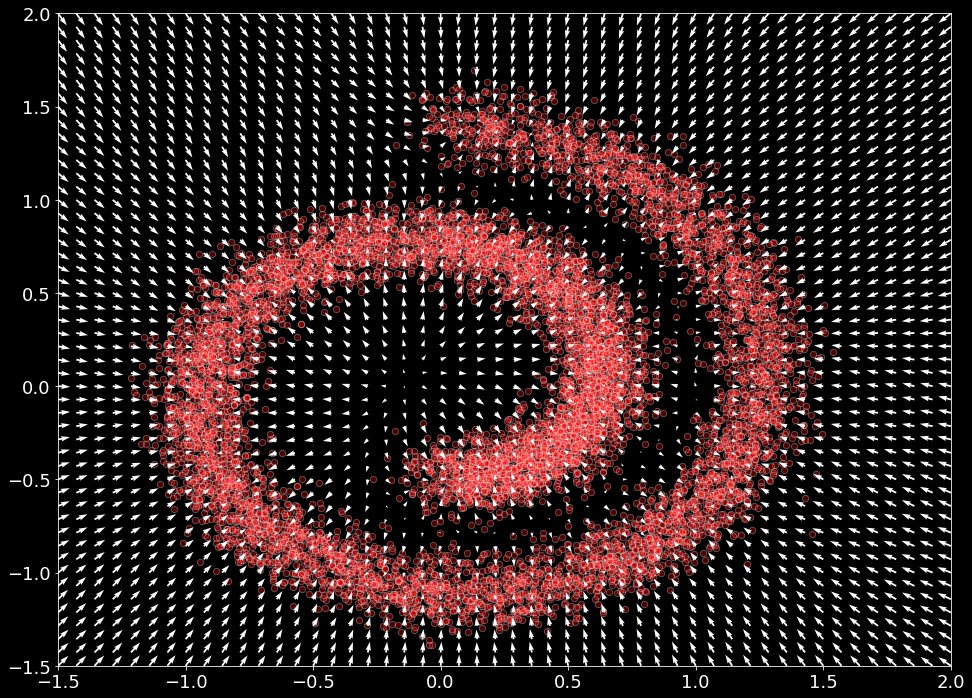

In [6]:
def plot_gradients(model, data, plot_scatter=True):
    '''
    - |xx| = |scores| = (2500, 2)
    - |scores_norm| = (2500, 1) := 각 샘플(2500개) 당 vector(gradient vector)의 norm값(gradient vector의 크기)
    - scores_log1p : 오로지 quiver plot 상 gradient vector를 모든 입력 좌표 상에서 잘 보일 수 있도록 하기 위해 구한 것(모델 상 의미는 없음)
        1) 'scores_norm' : score의 크기(gradient vector의 화살표 길이)
        2) 'scores_log1p' : score(gradient)를 [-1, 1]로 normalization(with scores_norm)
        3) 'scores_log1p' : score(gradient vector)의 정규화('2)') 후 log(score_norm)로 화살표 길이 약간은 gradient크기에 맞춰 차이가 나게끔 조절함
    '''
    xx = np.stack(np.meshgrid(np.linspace(-1.5, 2.0, 50), np.linspace(-1.5, 2.0, 50)), axis=-1).reshape(-1, 2)
    scores = model(torch.tensor(xx).float()).detach()
    scores_norm = np.linalg.norm(scores, axis=-1, ord=2, keepdims=True)  
    scores_log1p = scores / (scores_norm + 1e-9) * np.log1p(scores_norm)
    
    # Perform the plots
    plt.figure(figsize=(16,12))
    if (plot_scatter):
        plt.scatter(*data, alpha=0.3, color='red', edgecolor='white', s=40)
    plt.quiver(*xx.T, *scores_log1p.T, width=0.002, color='white')  # plt.quiver(X, Y, G_on_X, G_on_Y, ...)
    plt.xlim(-1.5, 2.0)
    plt.ylim(-1.5, 2.0)
    
data = sample_batch(10**4, noise=1.0).T  # |data| = (2, 10000) = (#features, #samples)
plot_gradients(model.to('cpu'), data)

### Langevin dynamics

학습 후, 우리 모델은 probability의 gradient를 계산(정확히는 approximation)할 수 있게 되었다. 즉, $\mathcal{F}_{\theta}(\mathbf{x}) \approx \nabla_x \log p(x)$에 어느정도 성공했다는 것이다. 이는 위에서 그린 quiver plot을 통해 확인했다. 그러므로 우리는 이 학습된 모델(gradient를 계산해내는)을 활용해 data를 생성해볼 것이다. 어떻게 data를 생성할까?

1. initial sample을 잡는다. initial sample은 $\mathbf{x}_{0} \sim \mathcal{N}(\mathbf{0},\mathbf{I})$으로 sampling한다.
2. gradient ascent를 통해 gradient를 따라 initial sample이 probability가 가장 높은(gradient vector가 가리키는 방향)곳으로 이동하게 한다.
3. 1-2의 과정을 반복할 수록, 생성되는 initial sample들이 gradient를 타고, probability가 높은 곳(원래 주어진 데이터의 probability)으로 모이게 된다.
4. 3.이 의미하는 것은 결국 본래 주어진 데이터의 probability에 맞게 데이터 포인트들이 모여, 새로운 데이터가 생성될 것이라는 의미이다.


- gradient ascent 알고리즘

$$\mathbf{x}_{t + 1} = \mathbf{x}_t + \epsilon \nabla_{\mathbf{x}_t} log p(\mathbf{x}_t)$$

$\epsilon$은 gradient의 방향으로 우리가 걸어들어갈 'step size'를 정의하는 상수이다.(일종의 'learning rate')

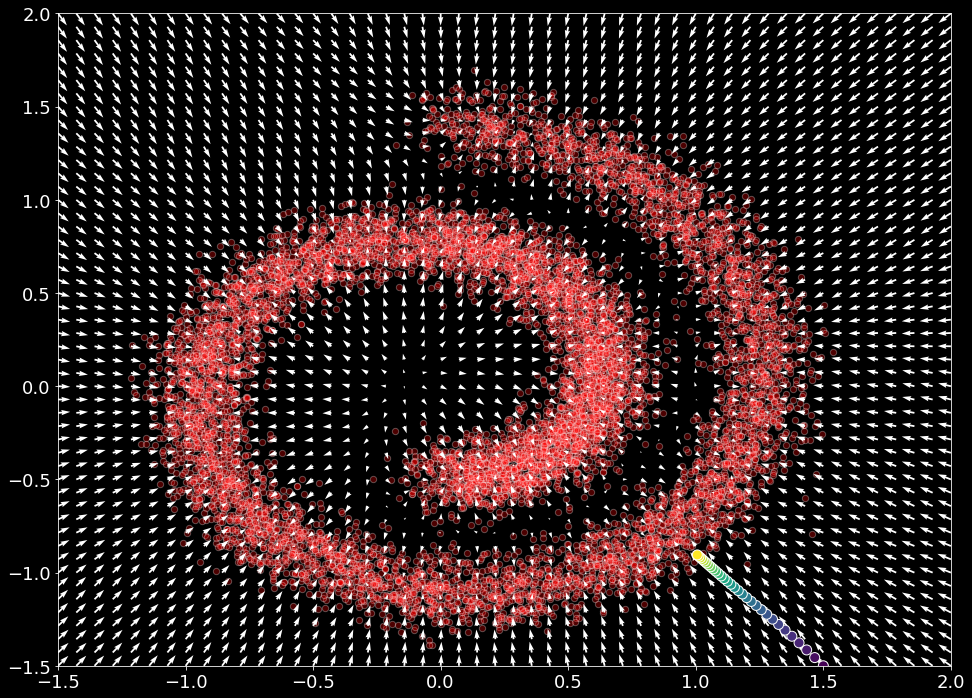

In [7]:
def sample_simple(model, x, n_steps=30, eps=(1e-4)*5):
    x_sequence = [x.unsqueeze(0)]
    for s in range(n_steps):
        x = x + eps * model(x)
        x_sequence.append(x.unsqueeze(0))
    return torch.cat(x_sequence)

x = torch.Tensor([1.5, -1.5]).to('cpu')
samples = sample_simple(model, x).detach()
plot_gradients(model.to('cpu'), data)

C = np.linspace(0, 30, len(samples))
plt.scatter(samples[:, 0], samples[:, 1], c=C, edgecolor='white', s=100)
plt.show()

# # draw arrows for each step
# deltas = (samples[1:] - samples[:-1])
# deltas = deltas - deltas / np.linalg.norm(deltas, keepdims=True, axis=-1) * 0.04
# for i, arrow in enumerate(deltas):
#     plt.arrow(samples[i,0], samples[i,1], arrow[0], arrow[1], width=1e-2, head_width=(2e-2)*2, color='Green', linewidth=0.1)  

하지만 위의 gradient ascent 알고리즘은 'true sample' from $\mathbf{x} \sim p(\mathbf{x})$을 생성하지는 않는다. '_true sample from real density_'를 얻기 위해, 우리는 _langevin dynamics_ 라는 방정식을 활용한다. _langevin dynamics_' 는 $p(\mathbf{x})$ density로부터 'true smaples'를 얻어낼 수 있다. _langevin dynamics_ 는 앞서 우리가 model로 구해낸 $\nabla_{\mathbf{x}} \log p(\mathbf{x})$에 의존한다. 샘플링은 MCMC접근법과 매우 유사한 방식으로 정의된다.

- MCMC 접근법 : MCMC를 수행한다는 것은 첫 샘플을 랜덤하게 선정한 뒤, 첫 샘플에 의해 그 다음번 샘플이 추천되는 방식의 시도를 무수하게 해본다는 의미

langevin dynamics는 아래와 같이 정의된다. 기본적으로 2번째 텀가지 gradient ascent 알고리즘과 유사하지만, 3번째 텀의 normal distribution sample이 추가되는 부분이 다르다.

$$\mathbf{x}_{t + 1} = \mathbf{x}_t + \frac{\epsilon}{2} \nabla_{\mathbf{x}_t} log p(\mathbf{x}_t) + \sqrt{\epsilon} \space\space\space \mathbf{z}_{t}$$

$$where \space \mathbf{z}_{t}\sim \mathcal{N}(\mathbf{0},\mathbf{I})$$ 


[Welling et al. (2011)](https://www.ics.uci.edu/~welling/publications/papers/stoclangevin_v6.pdf)의 연구에서 $\epsilon \rightarrow 0, t \rightarrow \inf$ 일 때, $\mathbf{x}_t$는 $p(\mathbf{x})$의 sample로 바로 정확하게 수렴(converge)한다는 것이 증명되었다.

이렇게 model에서 얻은 gradient와 langevin dynamics를 통해 MCMC 접근법을 통해 데이터의 모분포($p(\mathbf{x})$)의 sample을 **정확하게** 얻어낼 수 있다는 것(특정한 조건 "$\epsilon \rightarrow 0, t \rightarrow \inf$" 아래)이 바로 _score-based generative modeling_ 의 Key idea이다.

In [8]:
def sample_langevin(model, x, n_steps=100, eps=(1e-3), decay=.9, temperature=1):
    x_sequence = [x.unsqueeze(0)]
    for s in range(n_steps):
        z_t = torch.rand(x.size())  # |x| = [2]
        x = x + (eps / 2) * model(x) + (np.sqrt(eps) * temperature * z_t)
        x_sequence.append(x.unsqueeze(0))
        eps *= decay
    return torch.cat(x_sequence)

**eps = (1e-3)*3, decay = 0.9, temperature=1**

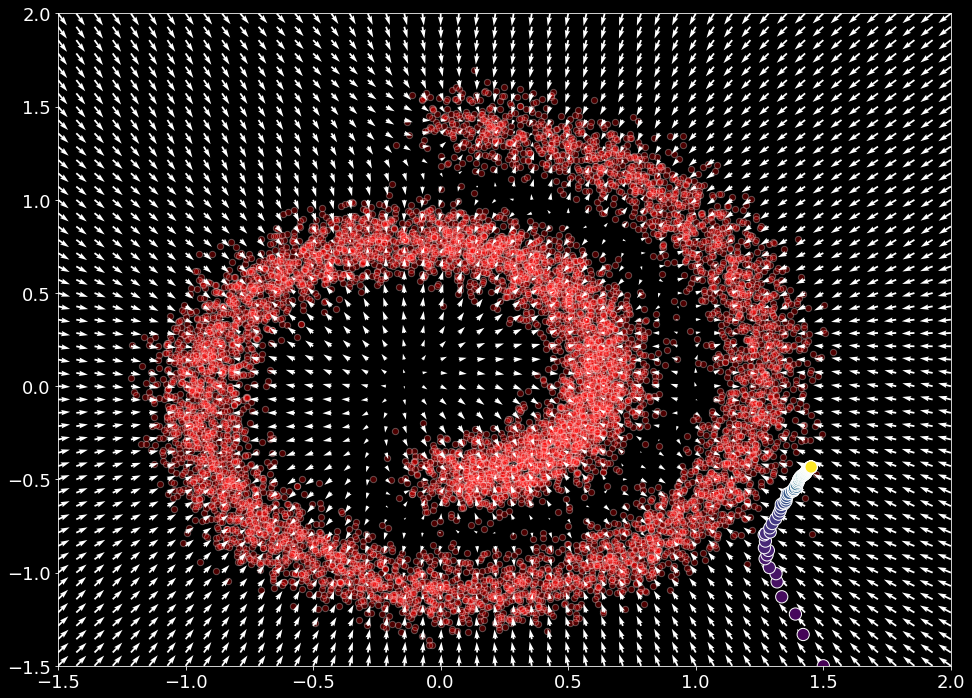

In [9]:
eps, decay, temperature = (1e-3)*3, .9, 1

x = torch.Tensor([1.5, -1.5])
samples = sample_langevin(model, x, eps=eps, decay=decay, temperature=temperature).detach()
plot_gradients(model, data)
C = np.linspace(0, len(samples), len(samples))
plt.scatter(samples[:, 0], samples[:, 1], c=C, edgecolor='white', s=150)
plt.show()

# # draw arrows for each mcmc step
# deltas = (samples[1:] - samples[:-1])
# deltas = deltas - deltas / np.linalg.norm(deltas, keepdims=True, axis=-1) * 0.04
# for i, arrow in enumerate(deltas):
#     plt.arrow(samples[i,0], samples[i,1], arrow[0], arrow[1], width=1e-4, head_width=2e-2, color="white", linewidth=1)
    

**eps = (1e-3)*3, decay = 0.9, temperature=0.5**

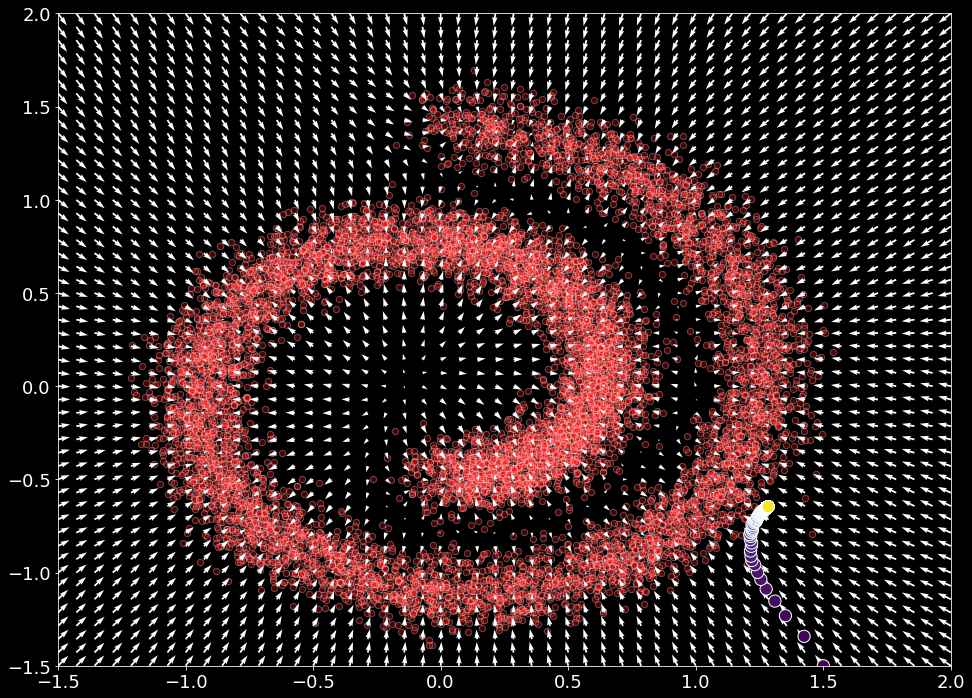

In [10]:
eps, decay, temperature = (1e-3)*3, .9, 0.5

x = torch.Tensor([1.5, -1.5])
samples = sample_langevin(model, x, eps=eps, decay=decay, temperature=temperature).detach()
plot_gradients(model, data)
C = np.linspace(0, len(samples), len(samples))
plt.scatter(samples[:, 0], samples[:, 1], c=C, edgecolor='white', s=150)
plt.show()

# # draw arrows for each mcmc step
# deltas = (samples[1:] - samples[:-1])
# deltas = deltas - deltas / np.linalg.norm(deltas, keepdims=True, axis=-1) * 0.04
# for i, arrow in enumerate(deltas):
#     plt.arrow(samples[i,0], samples[i,1], arrow[0], arrow[1], width=1e-4, head_width=2e-2, color="white", linewidth=1)
    

**eps = 1e-1, decay = 0.99, temperature=0.5**

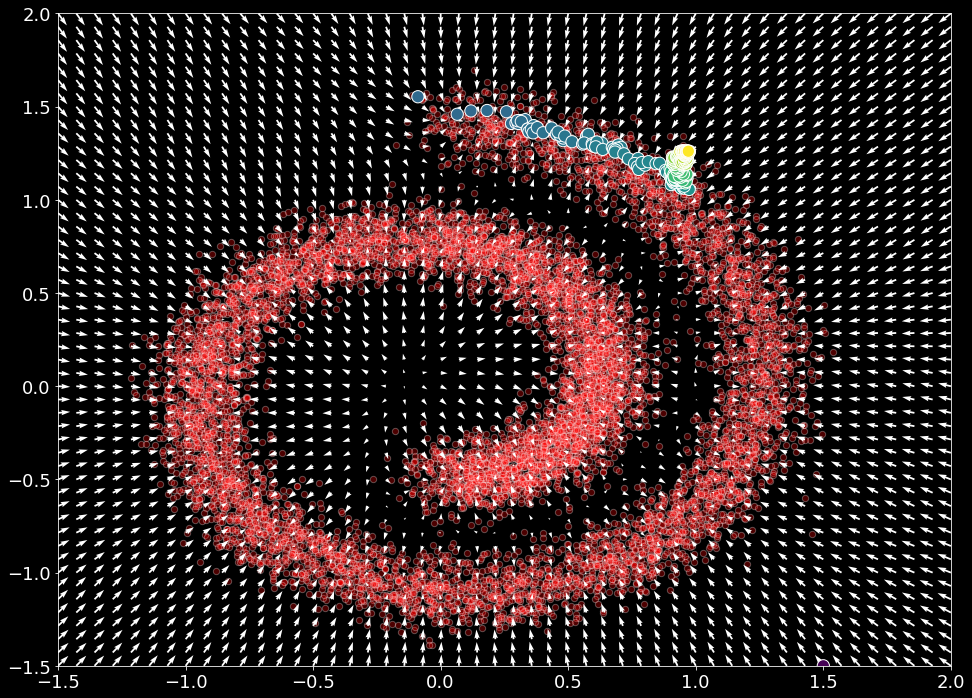

In [11]:
eps, decay, temperature = (1e-1), .99, 0.5

x = torch.Tensor([1.5, -1.5])
samples = sample_langevin(model, x, eps=eps, decay=decay, temperature=temperature, n_steps=500).detach()
plot_gradients(model, data)
C = np.linspace(0, len(samples), len(samples))
plt.scatter(samples[:, 0], samples[:, 1], c=C, edgecolor='white', s=150)
plt.show()

# # draw arrows for each mcmc step
# deltas = (samples[1:] - samples[:-1])
# deltas = deltas - deltas / np.linalg.norm(deltas, keepdims=True, axis=-1) * 0.04
# for i, arrow in enumerate(deltas):
#     plt.arrow(samples[i,0], samples[i,1], arrow[0], arrow[1], width=1e-4, head_width=2e-2, color="white", linewidth=1)
    

**eps = 1e-1, decay = 0.99, temperature=0.1**

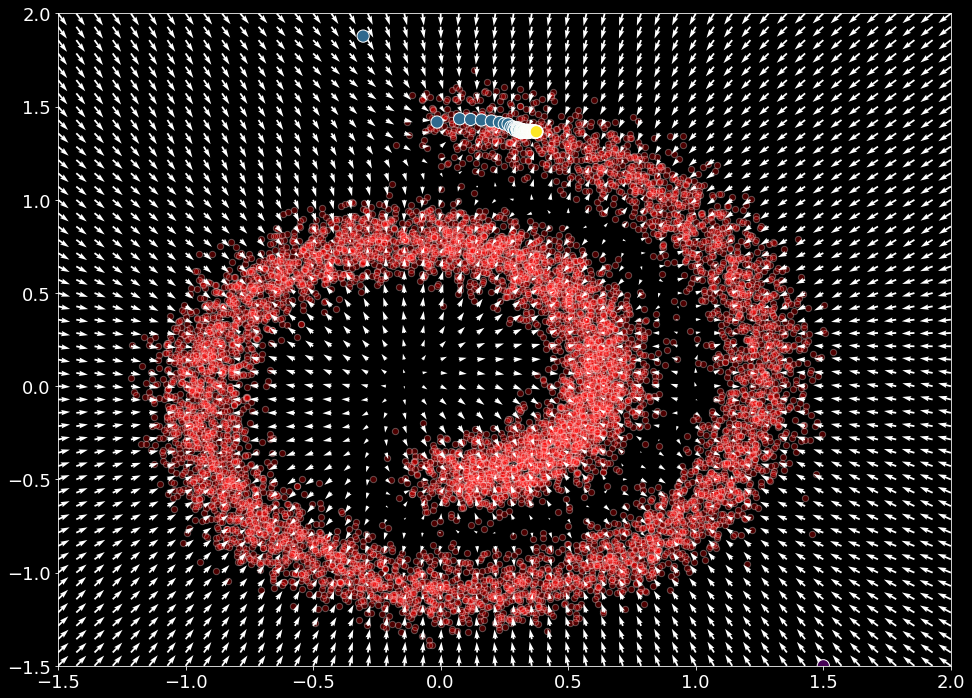

In [12]:
eps, decay, temperature = (1e-1), .99, 0.1

x = torch.Tensor([1.5, -1.5])
samples = sample_langevin(model, x, eps=eps, decay=decay, temperature=temperature, n_steps=500).detach()
plot_gradients(model, data)
C = np.linspace(0, len(samples), len(samples))
plt.scatter(samples[:, 0], samples[:, 1], c=C, edgecolor='white', s=150)
plt.show()

# # draw arrows for each mcmc step
# deltas = (samples[1:] - samples[:-1])
# deltas = deltas - deltas / np.linalg.norm(deltas, keepdims=True, axis=-1) * 0.04
# for i, arrow in enumerate(deltas):
#     plt.arrow(samples[i,0], samples[i,1], arrow[0], arrow[1], width=1e-4, head_width=2e-2, color="white", linewidth=1)
    

**eps = 1e-1, decay = 0.99, temperature=1**

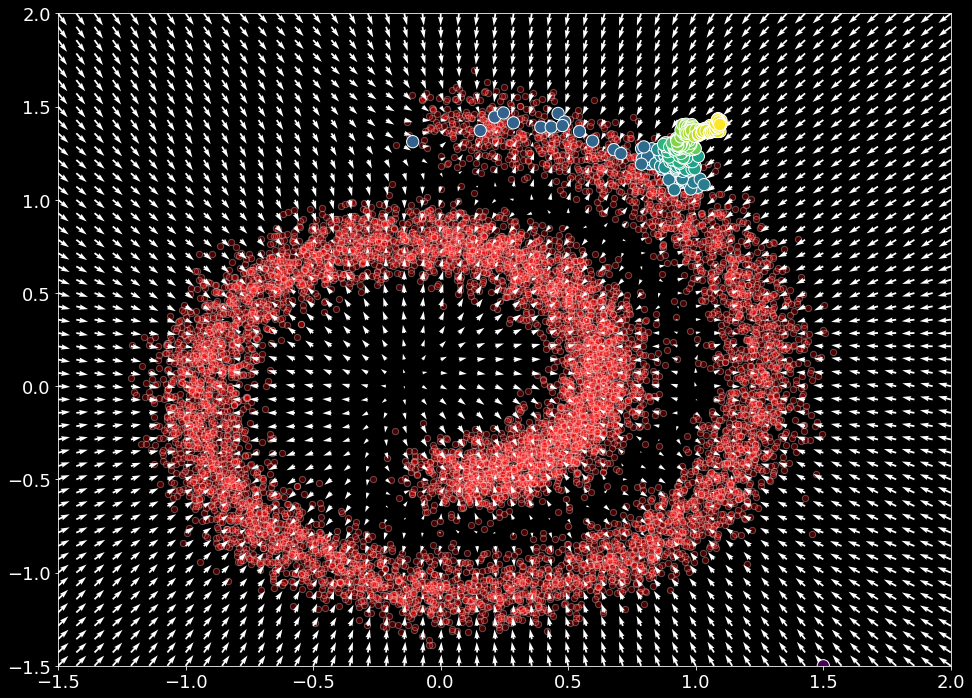

In [13]:
eps, decay, temperature = (1e-1), .99, 1

x = torch.Tensor([1.5, -1.5])
samples = sample_langevin(model, x, eps=eps, decay=decay, temperature=temperature, n_steps=500).detach()
plot_gradients(model, data)
C = np.linspace(0, len(samples), len(samples))
plt.scatter(samples[:, 0], samples[:, 1], c=C, edgecolor='white', s=150)
plt.show()

# # draw arrows for each mcmc step
# deltas = (samples[1:] - samples[:-1])
# deltas = deltas - deltas / np.linalg.norm(deltas, keepdims=True, axis=-1) * 0.04
# for i, arrow in enumerate(deltas):
#     plt.arrow(samples[i,0], samples[i,1], arrow[0], arrow[1], width=1e-4, head_width=2e-2, color="white", linewidth=1)
    

### Sliced score matching

기존의 _score matching loss_(아래) 는 high-dimensional데이터에 부적합하고, 따라서 deep learning 모델의 연산에도 좋은 loss가 아니다. 바로 $\text{ tr}\left( \nabla_{\mathbf{x}}  \mathcal{F}_{\theta}(\mathbf{x})  \right)$의 연산 때문이다. 

$$ \mathcal{L}_{matching} = E_{\mathbf{x} \sim p(\mathbf{x})} \left[ \text{ tr}\left( \nabla_{\mathbf{x}}  \mathcal{F}_{\theta}(\mathbf{x})  \right) + \frac{1}{2} \left\Vert \mathcal{F}_{\theta}(\mathbf{x}) \right\lVert_2^2 \right]$$

실제로 Jacobian의 계산은 $O(N^2 + N)$의 시간복잡도를 갖게 된다. 따라서 _score matching loss_ 를 보다 효율적으로 계산할 수 있도록 구성할 필요성이 높았다. 최근 Song et al(2020). [ [ 7 ] ](#ref7) 연구에서 score matching에서 $\text{ tr}\left( \nabla_{\mathbf{x}}  \mathcal{F}_{\theta}(\mathbf{x})  \right)$의 계산에 대한 approximation을 매우 효율적으로 진행할 수 있는 방법을 제안했다. 바로 **Random Projection**을 진행하는 것이다. _Sliced Score Matching_ 라고 불리우는 이 기법은 앞서 _score matching objective_ 를 아래와 같이 대체한다.

$$ \mathcal{L}_{sliced \ matching} = E_{\mathbf{v} \sim \mathcal{N}(0, 1)} E_{\mathbf{x} \sim p(\mathbf{x})} \left[ \mathbf{v}^T \nabla_{\mathbf{x}}  \mathcal{F}_{\theta}(\mathbf{x}) \mathbf{v} + \frac{1}{2} \left\Vert \mathbf{v}^T \mathcal{F}_{\theta}(\mathbf{x}) \right\lVert_2^2 \right]$$
$$where \space \mathbf{v} \sim \mathcal{N}(0, 1)$$

$\mathbf{v}$는 "a set of Normal-distributed vectors"이다. Song et al(2020). [ [ 7 ] ](#ref7)은 이 objective가 효율적으로 연산이 가능한 "forward mode auto-differentiation"로 계산된다는 것을 보여주었다. 구현은 아래와 같다.

In [14]:
def sliced_score_matching(model, samples):
    samples.requires_grad_(True)
    
    # Construct random vectors
    vectors = torch.randn_like(samples)
    vectors = vectors / torch.norm(vectors, dim=-1, keepdim=True)
    
    # Compute the optimized vector-product jacobian
    # autograd.functional.jvp : compute dot-product between Jacob(inpupt) and vector 'v'
    # logp : model(samples), 즉 score
    # jvp : dot-product between Jacob(inpupt) and vector 'v'
    logp, jvp = autograd.functional.jvp(model, samples, vectors, create_graph=True)
    
    # Compute the norm loss
    norm_loss = (logp * vectors) ** 2 / 2.
    
    # Compute the Jacobian loss
    v_jvp = jvp * vectors  # now, we complete the first term 'v.T * Jacob * v'
    jacob_loss = v_jvp
    loss = jacob_loss + norm_loss
    
    return loss.mean(-1).mean(-1)

- 기존의 _score matching loss_
```python
def score_matching(model, samples, train=False):
    samples.requires_grad_(True)
    logp = model(samples) # logp := model output
    
    # Compute the norm loss
    norm_loss = torch.norm(logp, dim=-1) ** 2 / 2.
    
    # Compute the Jacobian loss
    jacob_mat = jacobian(model, samples)
    tr_jacobian_loss = torch.diagonal(jacob_mat, dim1=-2, dim2=-1).sum(-1)
    
    return (tr_jacobian_loss + norm_loss).mean(-1)
```

새로운 objective를 정의했으니, 이전과 같이 이 objective를 기반으로 모델을 학습시켜보자. 뭐가 다를까?

In [15]:
# Our approximation model
model = nn.Sequential(
    nn.Linear(2, 128), nn.Softplus(),
    nn.Linear(128, 128), nn.Softplus(),
    nn.Linear(128, 2)
).to(device)
# Create ADAM optimizer over our model
optimizer = optim.Adam(model.parameters(), lr=1e-3)
dataset = torch.tensor(data.T).float().to(device)
for t in range(2000):
    # Compute the loss.
    loss = sliced_score_matching(model, dataset)
    # Before the backward pass, zero all of the network gradients
    optimizer.zero_grad()
    # Backward pass: compute gradient of the loss with respect to parameters
    loss.backward()
    # Calling the step function to update the parameters
    optimizer.step()
    # Print loss
    if ((t % 500) == 0):
        print(loss)

tensor(0.0434, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(-3.6087, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(-6.6126, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(-10.0030, device='cuda:0', grad_fn=<MeanBackward1>)


그리고 학습이 잘 되었는 지, quiver plot으로 다시 확인해본다.

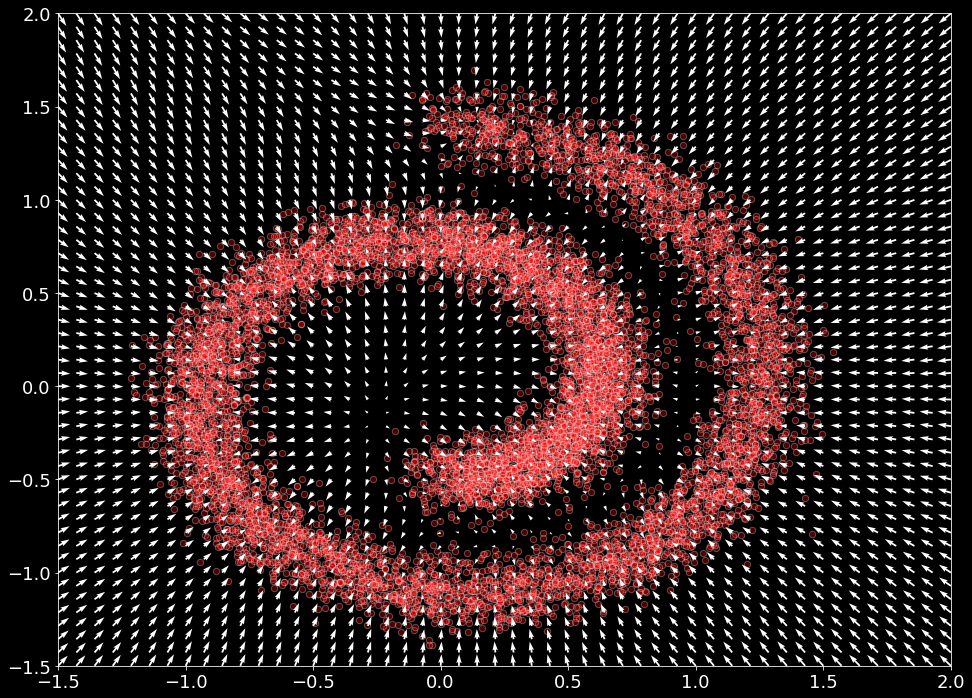

In [16]:
plot_gradients(model.to('cpu'), data)

### Denoising score matching

Vincent [ [ 3 ] ](#ref3)에 의해, _denoising auto-encoders_ 라는 개념 아래에서 _denoising score matching_ 개념이 최초로 다뤄진 적이 있다. _denoising score matching_ 은 score matching 계산 과정에서 $\nabla_{\mathbf{x}}  \mathcal{F}_{\theta}(\mathbf{x})$의 존재를 제거한다. 이를 위해 input point $\mathbf{x}$를 noise vector로 더럽혀(corrupt, $\tilde{\mathbf{x}}$) 아래와 같은 분포로 이끌어낼 것이다.
$$q_{\sigma}(\tilde{\mathbf{x}}\mid\mathbf{x})$$

그 후, **score matching**은 *기존처럼 원래의 origianl probability of input data가 아닌* **perturbed data distribution의 score를 추정**하는 데 사용될 것이다. 이처럼 perturbed data distribution의 score를 matching하는 접근은 [3]에서 다뤄진 적이 있다. 아래와 같이 perturbed data distribution에 대한 score matching은 정리된다.

$$ E_{q_{\sigma}(\tilde{\mathbf{x}}\mid\mathbf{x})} E_{\mathbf{x} \sim p(\mathbf{x})} \left[ \left\Vert \mathcal{F}_{\theta}(\tilde{\mathbf{x}}) - \nabla_{\tilde{\mathbf{x}}} \log q_{\sigma}(\tilde{\mathbf{x}}\mid\mathbf{x}) \right\lVert_2^2 \right]$$


하지만 주의해야할 점이 있다. $\mathcal{F}_{\theta}(\mathbf{x}) = \nabla_{\mathbf{x}} \log q_{\sigma}(\mathbf{x}) \approx \nabla_{\mathbf{x}} \log p(\mathbf{x})$는 오직 noise가 $q_{\sigma}(\mathbf{x}) \approx p(\mathbf{x})$일 만큼 작아야 가능하다. [ [ 3 ] ](#ref3),[ [ 8 ] ](#ref8)에서 제안하였듯, 우리가 noise distribution을 $q_{\sigma}(\tilde{\mathbf{x}}\mid\mathbf{x})=\mathcal{N}(\tilde{\mathbf{x}}\mid\mathbf{x}, \sigma^{2}\mathbf{I})$로 정한다면, 우리는 아래와 같은 정리가 가능하다.

$$\nabla_{\tilde{\mathbf{x}}} \log q_{\sigma}(\tilde{\mathbf{x}}\mid\mathbf{x}) = \frac{\tilde{\mathbf{x}} - \mathbf{x}}{\sigma^{2}}$$

따라서 noise distribution을 사전적으로 정의해, _denosing score matching loss_ 를 구할 수 있다.

$$ \mathcal{L}_{denoising}(\theta;\sigma) = E_{q_{\sigma}(\tilde{\mathbf{x}}\mid\mathbf{x})} E_{\mathbf{x} \sim p(\mathbf{x})} \left[ \left\Vert \mathcal{F}_{\theta}(\tilde{\mathbf{x}}) +  \frac{\tilde{\mathbf{x}} - \mathbf{x}}{\sigma^{2}} \right\lVert_2^2 \right]
, $$

그리고 아래와 같이 _denosing score matching loss_ 를 구현할 수 있다.

In [17]:
def denoising_score_matching(scorenet, samples, sigma=0.01):
    perturbed_samples = samples + torch.randn_like(samples) * sigma  # perturbed_x = x + z * sigma
    target = - 1 / (sigma ** 2) * (perturbed_samples - samples)
    scores = scorenet(perturbed_samples)
    target = target.view(target.shape[0], -1)
    scores = scores.view(scores.shape[0], -1)
    loss = 1 / 2. * ((scores - target) ** 2).sum(dim=-1).mean(dim=0)
    return loss

정의한 denoising score matching loss(objective)에 대해 이전과 같이 model, optimizer정의 후 학습을 진행한다.

In [18]:
# Our approximation model
model = nn.Sequential(
    nn.Linear(2, 128), nn.Softplus(),
    nn.Linear(128, 128), nn.Softplus(),
    nn.Linear(128, 2)
).to(device)
# Create ADAM optimizer over our model
optimizer = optim.Adam(model.parameters(), lr=1e-3)
dataset = torch.tensor(data.T).float().to(device)
for t in range(5000):
    # Compute the loss.
    loss = denoising_score_matching(model, dataset)
    # Before the backward pass, zero all of the network gradients
    optimizer.zero_grad()
    # Backward pass: compute gradient of the loss with respect to parameters
    loss.backward()
    # Calling the step function to update the parameters
    optimizer.step()
    # Print loss
    if ((t % 1000) == 0):
        print(loss)

tensor(9989.1709, device='cuda:0', grad_fn=<MulBackward0>)
tensor(9888.6240, device='cuda:0', grad_fn=<MulBackward0>)
tensor(10117.3008, device='cuda:0', grad_fn=<MulBackward0>)
tensor(9927.9570, device='cuda:0', grad_fn=<MulBackward0>)
tensor(10119.1807, device='cuda:0', grad_fn=<MulBackward0>)


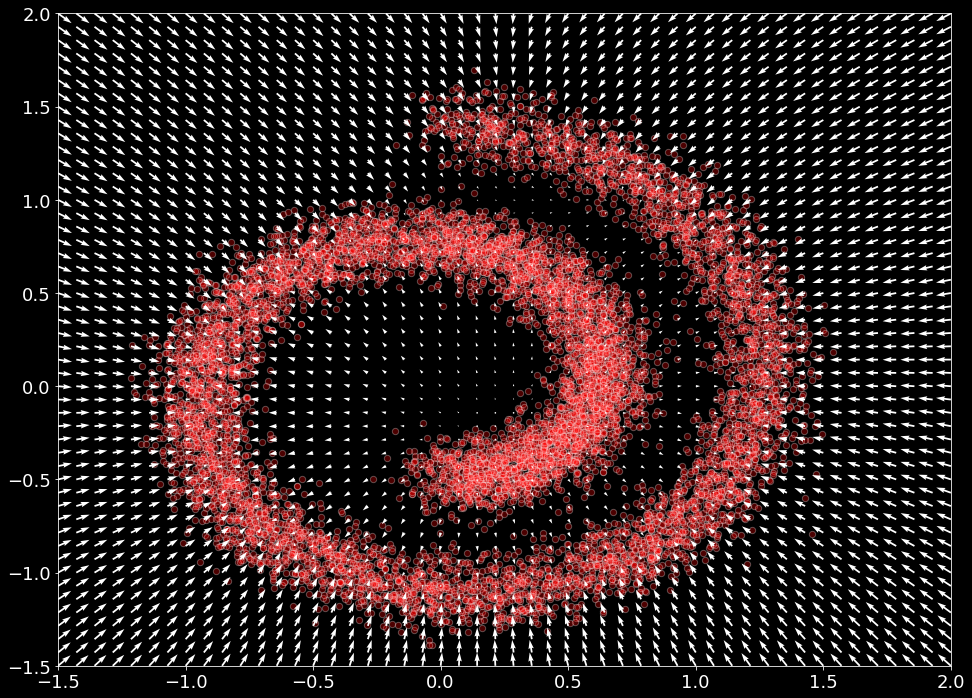

In [19]:
plot_gradients(model.to('cpu'), data)

### Noise conditional score networks

최근 연구에서 Song and Ermon [ [ 8 ] ](#ref8)는 지금까지 살펴본 score-based generative framework를 발전시킨 _Noise-Conditional Score Networks(NCSN)_ 를 제안했다. Song and Ermon는 현재까지의 score matching objectives(ex: _sliced score matching_)은 몇가지 결함을 갖고 있다고 지적했다.

첫 째로 Song and Ermon은 데이터가 manifold 가설을 따른다는 가정 아래에선, noise가 없는(상정하지 않는)'sliced score matching' 최적화를 진행하는 것이 'inconsistent'하다는 것을 보였다. 즉, noiseless objectives(_sliced score matching_)는 분포가 전체공간(whole space)에 걸쳐 확장되어있을 때만 consistent(일관된)하다는 것이다(역자 생각 : 전체 공간에서 분포가 곳곳이 비어있는 경우, 기존의 sliced score matching을 진행하는 것이 manifold 가설에 비춰보면 일관되지 못하다는 주장. ([Yang song님의 blog에 illustration과 함께 보다 친절히 설명돼 있습니다.](https://yang-song.github.io/blog/2021/score/)).

둘 째로 Song and Ermon는 low density regions(전체 공간에서 분포가 비어있거나, 밀도가 낮은 부분. 앞 단락에서 언급한..)은 score matching과 langevin dynamics 샘플링에 어려움을 유발할 수 있다는 것을 보였다. 

이러한 이슈들을 다루기 위해, Song and Ermon [ [ 8 ] ](#ref8)는 perturbed data(noise가 가미된)를 활용하는 방법론을 제안했다. 해당 방법론은 단일 Noise-Conditional Score Network(NCSN)을 학습해, 다양한 level(noise의 분산 정도)의 noise가 가미된(perturbed data) data의 score를 추정할 수 있다. 이를 위해, NCSN은 우선 다양한 noise level을 구성하기 위해 'a positive geometric sequence of noise variance $\{\sigma_{i}\}_{i=1}^{L}$를 상정한다. 이러한 sequence of noise($\{\sigma_{i}\}_{i=1}^{L}$) 중 $\sigma_{1}$를 가장 큰 값을 갖도록 지정한다. 그리고 sequence의 개별 noise들은 아래의 조건을 만족해야 한다(sequence 뒷쪽으로 갈 수록 분산 값이 작아지도록 함).

$$\frac{\sigma_{1}}{\sigma_{2}} = \cdots = \frac{\sigma_{L-1}}{\sigma_{L}} > 1$$

NCSN을 학습하는 목적은 모든 perturbed data distributions의 gradients를 추정(estimate)하는 것이다. 이를 수식으로 나타내면 아래와 같다.

$$
\forall \sigma \in \{\sigma_{i}\}_{i=1}^{L}, \mathcal{F}_{\theta}(\tilde{\mathbf{x}}, \sigma) \approx \nabla_{\mathbf{x}} \log q_{\sigma}(\mathbf{x})
$$

_NCSN(Noise-Conditional Score Networks)_ 의 최적화는 앞서 정의한 denoising score matching objective에서 시작한다.

$$ \mathcal{l}(\theta;\sigma) = E_{q_{\sigma}(\tilde{\mathbf{x}}\mid\mathbf{x})} E_{\mathbf{x} \sim p(\mathbf{x})} \left[ \left\Vert \mathcal{F}_{\theta}(\tilde{\mathbf{x}}, \sigma) +  \frac{\tilde{\mathbf{x}} - \mathbf{x}}{\sigma^{2}} \right\lVert_2^2 \right]
$$

그리고 이 denoising score matching objective를 단일 level의 noise(a single noise level)로 보고, 여러 level의 noise에 대한 최적화 식(a single unified objective)를 아래와 같이 여러 noise level에 대한 $\lambda$ 가중평균 조합(combination)으로 정의할 수 있다.

$$
\mathcal{L}(\theta;\{\sigma_{i}\}_{i=1}^{L}) = \frac{1}{L} \sum_{i=1}^{L} \lambda(\sigma_{i})\mathcal{l}(\theta;\sigma_{i})
$$

where $\lambda(\sigma_{i}) > 0$는 $\sigma_{i}$에 의존적인(depending) coefficient이다.

NCSN의 objective는 아래와 같이 코드로 구현된다.


In [20]:
def anneal_dsm_score_estimation(model, samples, labels, sigmas, anneal_power=2.):
    '''
    [shape]
        used_sigmas.size() : torch.Size([10000, 1])
        perturbed_samples.size() : torch.Size([10000, 2])
        target.size() : torch.Size([10000, 2])
        scores.size() : torch.Size([10000, 2])
        loss.size() : torch.Size([10000])
        sigmas.size() : torch.Size([4])
        labels.size() : torch.Size([10000])
        used_sigmas.size() : torch.Size([10000, 1])
        
    4개의 noise level([1.0000, 0.2154, 0.0464, 0.0100])중 
    random하게 10,000개를 1개씩 골라 각 sample(#:10000)에 noise perburbation 진행.
    
    [개인적인 생각]
        개인적으로는 10000개에 각각 noise(1.0000)으로 먼저 perturbation후 loss구하고, 
        그리고 noise(0.2154)로 perturbation후 loss구하는 방향으로 생각함.
        하지만 본 코드는 여러 level의 noise를 순차적으로 모든 sample에 일괄 적용하는 방식은 아닌듯 함.
    '''
    used_sigmas = sigmas[labels].view(samples.shape[0], *([1] * len(samples.shape[1:])))
    perturbed_samples = samples + torch.randn_like(samples) * used_sigmas
    target = - 1 / (used_sigmas ** 2) * (perturbed_samples - samples)
    scores = model(perturbed_samples, labels)
    target = target.view(target.shape[0], -1)
    scores = scores.view(scores.shape[0], -1)
    loss = 1 / 2. * ((scores - target) ** 2).sum(dim=-1) * used_sigmas.squeeze() ** anneal_power
    
    return loss.mean(dim=0)

앞선 방정식에서 확인했듯, NCSN은 Noise-Conditional network $\mathcal{F}_{\theta}(\tilde{\mathbf{x}}, \sigma_{i})$를 필요로 한다. 따라서 model은 서로 다른 noise level $\sigma_{i}$을 입력 받아야한다. 이를 반영해 아래와 같이 model을 정의할 수 있다.

In [21]:
import torch.nn.functional as F

class ConditionalLinear(nn.Module):
    def __init__(self, num_in, num_out, num_classes):
        super().__init__()
        self.num_out = num_out
        self.lin = nn.Linear(num_in, num_out)
        self.embed = nn.Embedding(num_classes, num_out) # embedding 차원이 128인 4개의 vector 생성
        self.embed.weight.data.uniform_() # embedding layer initialization with unif. distribution

    def forward(self, x, y):
        '''
        gamma : 10000개의 sample이 각각 128차원 공간 속에서의 noise level에 맞는 embedding vector를 갖게됨. 
                그것이 gamma, |.| = (10000, 128)
                
        out   : Conditional linear output , |.| = (10000, 128)
        
        x     : input data , |.| = (10000, 2) 
        
        y     : labels, 각 sample(# = 10000)별로 perturb된 noise의 level 정보 
                embedding vector의 4 level noise sigma 중 어떤 noise의 embedding vector를 선택할 지의 index정보
        '''
        out = self.lin(x)
        gamma = self.embed(y)
        out = gamma.view(-1, self.num_out) * out
        return out
    
class ConditionalModel(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.lin1 = ConditionalLinear(2, 128, num_classes)
        self.lin2 = ConditionalLinear(128, 128, num_classes)
        self.lin3 = nn.Linear(128, 2)
    
    def forward(self, x, y):
        '''
        x : perturbed_samples, |.| = (10000, 2)
        y : labels, |.| = (10000)
        '''
        x = F.softplus(self.lin1(x, y))
        x = F.softplus(self.lin2(x, y))
        return self.lin3(x)

모델을 정의했으니, optimization을 수행한다.

In [22]:
sigma_begin = 1
sigma_end = 0.01
num_classes = 4  # num_classes : noise level 수
sigmas = torch.tensor(np.exp(np.linspace(np.log(sigma_begin), np.log(sigma_end), num_classes))).float()

# Our approximation model
model = ConditionalModel(num_classes)
dataset = torch.tensor(data.T).float()

# Create ADAM optimizer over our model
optimizer = optim.Adam(model.parameters(), lr=1e-3)
for t in range(5000):
    # Compute the loss.
    labels = torch.randint(0, len(sigmas), (dataset.shape[0],))
    loss = anneal_dsm_score_estimation(model.to(device), dataset.to(device), labels.to(device), sigmas.to(device))
    # Before the backward pass, zero all of the network gradients
    optimizer.zero_grad()
    # Backward pass: compute gradient of the loss with respect to parameters
    loss.backward()
    # Calling the step function to update the parameters
    optimizer.step()
    # Print loss
    if ((t % 1000) == 0):
        print(loss)

tensor(1.0425, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(0.7989, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(0.7854, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(0.7716, device='cuda:0', grad_fn=<MeanBackward1>)
tensor(0.7557, device='cuda:0', grad_fn=<MeanBackward1>)


(-1.5, 2.0)

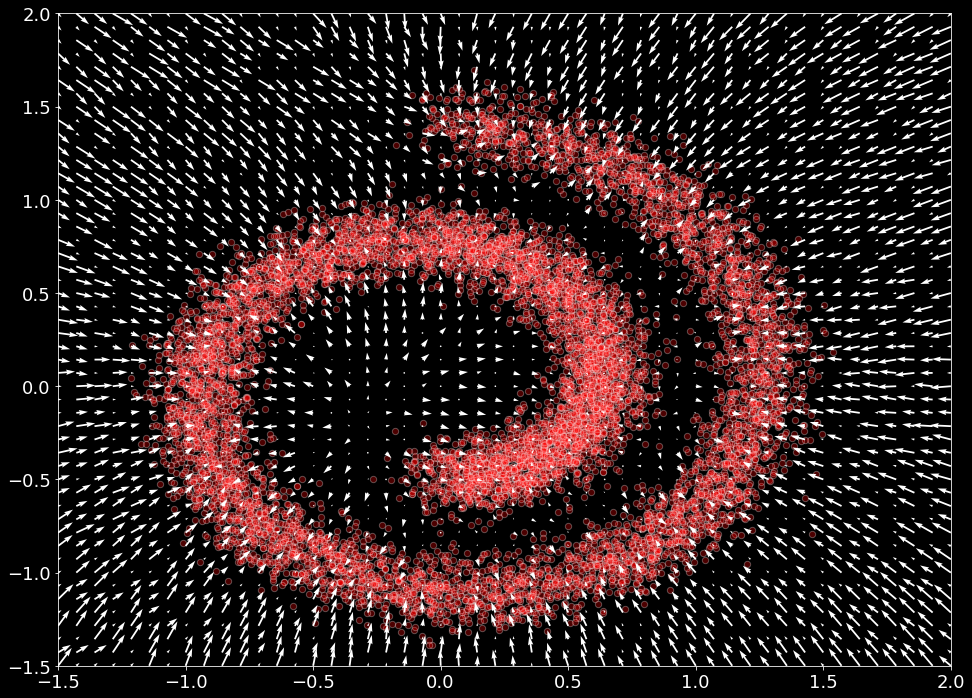

In [23]:
xx = np.stack(np.meshgrid(np.linspace(-1.5, 2.0, 50), np.linspace(-1.5, 2.0, 50)), axis=-1).reshape(-1, 2)
labels = torch.randint(0, len(sigmas), (xx.shape[0],))
scores = model.to('cpu')(torch.tensor(xx).float(), labels).detach()
scores_norm = np.linalg.norm(scores, axis=-1, ord=2, keepdims=True)
scores_log1p = scores / (scores_norm + 1e-9) * np.log1p(scores_norm)

# Perform the plots
plt.figure(figsize=(16,12))
plt.scatter(*data, alpha=0.3, color='red', edgecolor='white', s=40)
plt.quiver(*xx.T, *scores_log1p.T, width=0.002, color='white')
plt.xlim(-1.5, 2.0)
plt.ylim(-1.5, 2.0)

**single level noise NCSN**

(-1.5, 2.0)

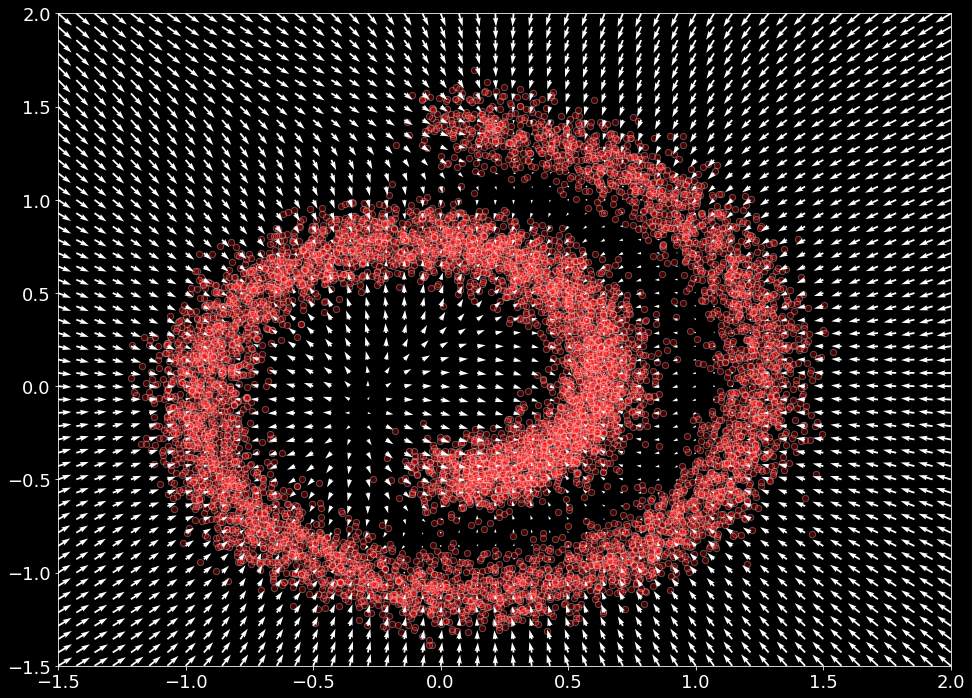

In [24]:
xx = np.stack(np.meshgrid(np.linspace(-1.5, 2.0, 50), np.linspace(-1.5, 2.0, 50)), axis=-1).reshape(-1, 2)
labels = torch.ones(xx.shape[0]).long()
scores = model.to('cpu')(torch.tensor(xx).float(), labels).detach()
scores_norm = np.linalg.norm(scores, axis=-1, ord=2, keepdims=True)
scores_log1p = scores / (scores_norm + 1e-9) * np.log1p(scores_norm)

# Perform the plots
plt.figure(figsize=(16,12))
plt.scatter(*data, alpha=0.3, color='red', edgecolor='white', s=40)
plt.quiver(*xx.T, *scores_log1p.T, width=0.002, color='white')
plt.xlim(-1.5, 2.0)
plt.ylim(-1.5, 2.0)

# Supplements

## supplement : make_swiss_roll data

- [sklearn doc link](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.make_swiss_roll.html)

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


x shape : (10000, 3)
x.T shape : (3, 10000)
t shape : (10000,)


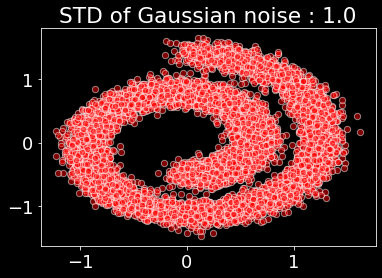

In [25]:
from sklearn.datasets import make_swiss_roll

x, t = make_swiss_roll(n_samples=10**4, noise=1.0, random_state=0)
print(f"x shape : {x.shape}")
print(f"x.T shape : {x.T.shape}")
print(f"t shape : {t.shape}")

data = (x[:, [0, 2]] / 10.0).T  # /10.0 은 데이터 정규화 (-20,20) -> (-1,1)
plt.scatter(*data, alpha=0.5, color='red', edgecolor='white', s=40)
plt.title("STD of Gaussian noise : 1.0")
plt.show()

x shape : (10000, 3)
x.T shape : (3, 10000)
t shape : (10000,)


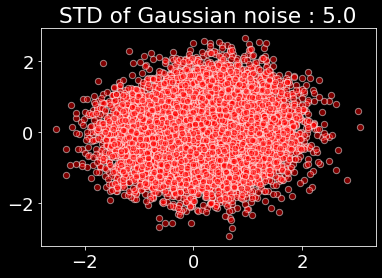

In [26]:
x, t = make_swiss_roll(n_samples=10**4, noise=5.0, random_state=0)
print(f"x shape : {x.shape}")
print(f"x.T shape : {x.T.shape}")
print(f"t shape : {t.shape}")

data = (x[:, [0, 2]] / 10.0).T
plt.scatter(*data, alpha=0.5, color='red', edgecolor='white', s=40)
plt.title("STD of Gaussian noise : 5.0")
plt.show()

x shape : (10000, 3)
x.T shape : (3, 10000)
t shape : (10000,)


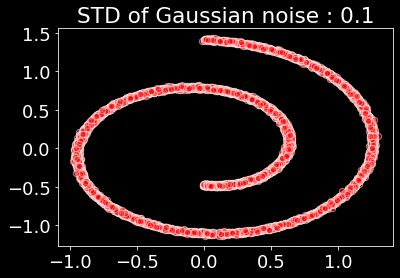

In [27]:
x, t = make_swiss_roll(n_samples=10**4, noise=0.1, random_state=0)
print(f"x shape : {x.shape}")
print(f"x.T shape : {x.T.shape}")
print(f"t shape : {t.shape}")

data = (x[:, [0, 2]] / 10.0).T
plt.scatter(*data, alpha=0.5, color='red', edgecolor='white', s=40)
plt.title("STD of Gaussian noise : 0.1")
plt.show()

## supplement : Example for Jacobian function

<img src="images/jacobian.jpeg" width="800" height="500">

In [28]:
def f(x):
    result = torch.zeros_like(x)
    result[:,0] = torch.pow(x[:, 0],2) + x[:, 1]*2
    result[:,1] = torch.pow(x[:, 1],2) + x[:, 0]*2
    return result

In [29]:
x = torch.FloatTensor([10, 100]).unsqueeze(1).T.requires_grad_(True)
print(f"x.shape             = [B, N]    : {x.shape}")
print(f"jacobian(f,x).shape = [B, N, N] : {jacobian(f,x).shape}")
jacobian(f, x)

x.shape             = [B, N]    : torch.Size([1, 2])
jacobian(f,x).shape = [B, N, N] : torch.Size([1, 2, 2])


tensor([[[ 20.,   2.],
         [  2., 200.]]], grad_fn=<StackBackward>)

## supplement : $\mathcal{L}_{mse}$ objective

$$ \mathcal{L}_{matching} = E_{\mathbf{x} \sim p(\mathbf{x})} \left[ \text{ tr}\left( \nabla_{\mathbf{x}}  \mathcal{F}_{\theta}(\mathbf{x})  \right) + \frac{1}{2} \left\Vert \mathcal{F}_{\theta}(\mathbf{x}) \right\lVert_2^2 \right]
, $$

- 해당 공식의 도출은 [ [ 3 ] ](#ref3)과 [ [ 6 ] ](#ref6)에 증명되어있음

## supplement : nn.Softplus()

## supplement : quiver plot

- contour plot위에 그레디언트 벡터를 화살표로 나타낸 것을 플롯을 퀴버(quiver)플롯이라고 한다. 퀴버플롯에서 화살표는 화살표 시작 지점의 그레디언트 벡터를 나타낸다.
    - [reference](https://datascienceschool.net/02%20mathematics/04.04%20행렬의%20미분.html?highlight=quiver)

## supplement : np.log1p( )

- [reference](https://velog.io/@gjtang/np.log1p를-하는-이유)

- np.log: $ln(x)$
- np.log1p: $ln(x+1)$

기본적으로 log안의 x값은 아래 그래프처럼 양수만 가능하다. 하지만 0에 가까운 아주 작은 양수의 경우 (ex. 0.0000000001) 음의 무한대에 가까워지게 된다(너무 작은 값의 경우 프로그램의 계산이 -inf가 나오게됨). 이를 방지하기 위해 1을 더함으로써 0보다 큰 양수의 값을 갖게 된다.

## supplement : plot_gradients( )

- 왜 score(gradient)를 plot할 때, normalize해주는 가?
- 아래처럼 모델의 output(gradient, score)를 **normalize해주지 않고** 그냥 그리게 되면, gradient값의 절대 값의 차이에 따라 너무 편차가 크게 나타나 직접적인 방향의 식별이 어려운 부분(예를 들면 나선형의 가운데 부분)이 생기게 된다. 따라서 _norm_ 으로 정규화해줘 값의 편차가 크지 않고, 대신 벡터의 방향은 식별될 수 있게 한다.

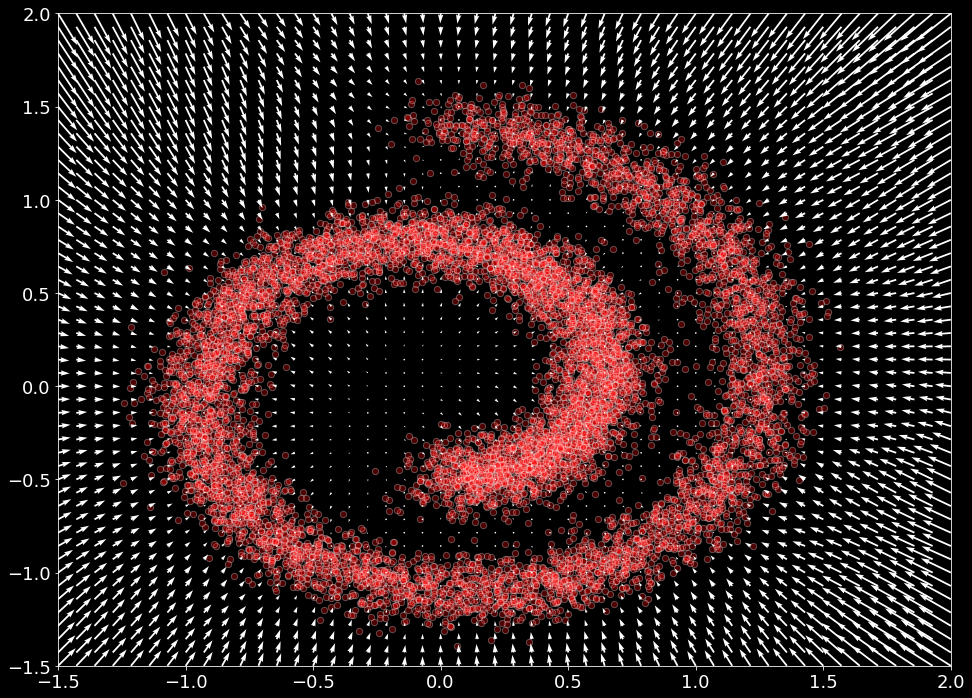

In [39]:
def plot_gradients(model, data, plot_scatter=True):
    xx = np.stack(np.meshgrid(np.linspace(-1.5, 2.0, 50), np.linspace(-1.5, 2.0, 50)), axis=-1).reshape(-1, 2)
    scores = model(torch.tensor(xx).float()).detach()
#     scores_norm = np.linalg.norm(scores, axis=-1, ord=2, keepdims=True)
#     scores_log1p = scores / (scores_norm + 1e-9) * np.log1p(scores_norm)
    
    # Perform the plots
    plt.figure(figsize=(16,12))
    if (plot_scatter):
        plt.scatter(*data, alpha=0.3, color='red', edgecolor='white', s=40)
#     plt.quiver(*xx.T, *scores_log1p.T, width=0.002, color='white')  # plt.quiver(X, Y, G_on_X, G_on_Y, ...)
    plt.quiver(*xx.T, *scores.T, width=0.002, color='white')  # plt.quiver(X, Y, G_on_X, G_on_Y, ...)
    plt.xlim(-1.5, 2.0)
    plt.ylim(-1.5, 2.0)
    
data = sample_batch(10**4, noise=1.0).T  # |data| = (2, 10000) = (#features, #samples)
plot_gradients(model.to('cpu'), data)

## supplement : MCMC

- [MCMC(Monte Carlo-Markov Chain)](https://angeloyeo.github.io/2020/09/17/MCMC.html) : 샘플링 방법 중 하나. 
    - MC(Monte Carlo) : 무수히 많은 시뮬레이션을 통해 통계적인 수치를 얻어내는 접근법
    - Markov Chain : 과거 상태들($s_{1}, s_{2}, ..., s_{t-1}$)과 현재 상태($s_{t}$)가 주어졌을 때, 미래 상태($s_{t+1}$)는 과거 상태와는 독립적으로 현재 상태에 의해서만 결정된다는 것을 의미함. 다른 말로 표현하면, 과거와 현재 상태 모두를 고려했을 때 미래 상태가 나타날 확률과 현재 상태만을 고려했을 때 미래 상태가 발생할 확률이 동일하다는 것.
    
$$ P[s_{t+1}|s_{t}] = P[s_{t+1}|s_{1},...,s_{t}] $$

## supplement : Markov Chain

- Reference
    - [마르코프 체인에 관하여 - PuzzleData](https://www.puzzledata.com/blog190423/)    
    - [[강화학습] 마코프 프로세스(=마코프 체인) 제대로 이해하기](https://bskyvision.com/573)
    

**Markov chain이란 무엇일까?**

Markov chain이라는 단어가 심심치 않게 자주 등장하는 것을 알 수 있다. 이번 글은 새로이 각광받고 있는 Deep generative model의 계열 중 하나인 [Diffusion model을 공부](https://lilianweng.github.io/lil-log/2021/07/11/diffusion-models.html)하며 등장한 Markov chain을 제대로 이해해보기 위해 작성한다.

Markov chain이란 아주 간단한 개념이다.

엄밀한 정의론, **Markov chain**은 **마르코프 성질**을 갖는 **이산 확률과정**을 의미한다. 여기서 ‘마르코프 성질’이란 “특정 상태의 확률은 오직 현재의 상태에 의존한다”는 성질을 의미한다. 즉, **과거 상태들($s_{1}, s_{2}, ..., s_{t-1}$)과 현재 상태($s_{t}$)가 주어졌을 때, 미래 상태($s_{t+1}$)는 과거 상태와는 독립적으로 현재 상태에 의해서만 결정된다는 것을 의미한다.** 다른 말로 표현하면, 과거와 현재 상태 모두를 고려했을 때 미래 상태가 나타날 확률과 현재 상태만을 고려했을 때 미래 상태가 발생할 확률이 동일하다는 것이다[1]. 이를 식으로 나타내면 다음과 같다. (출처 : [https://bskyvision.com/573](https://bskyvision.com/573))

$$
P[s_{t+1}|s_{t}] = P[s_{t+1}|s_{1},...,s_{t}]
$$

이렇게 가정해보자. 만약, 날씨가 전 날의 날씨에 따라 결정되는 확률적인 과정이라고 가정해보자. 물론, 실제 내일의 날씨는 오늘의 날씨가 무엇이었는지 보다는 현재의 기압, 기온 등에 큰 영향을 받을 것이기 때문에, 이러한 가정은 현실과 맞지 않다. 하지만, 그렇게 가정해보자. 이렇게 이야기할 수 있다는 것이다. “오늘의 날씨가 흐렸으니, 내일 날씨가 맑을 확률은 30%, 흐릴 확률은 70%다.”라고 말이다. 이런 세상에서 매일 같이 계속해서 오늘과 내일의 날씨를 기록해간다면, 어느 순간에는 이 선후 관계가 어느정도 수렴하는 단계가 나타날 것이다. 즉, “오늘 날씨가 흐리기 때문에, 내일은 무조건 흐린다.” 와 같은 관계가 성립되는 것이 아니라, “오늘 날씨가 흐리기 때문에, 내일 날씨가 흐릴 확률은 70%, 맑을 확률은 30%이다,”라고 자신있게 말할 수 있는 확률적인 관계가 안정적으로 수립된다는 것이다. 그리고 이때는 역시나 “오늘” 날씨를 기반으로 “내일” 날씨를 본다. “어제”의 날씨는 고려하지 않는다. “모레”를 봐야 한다면, “오늘”에서 “내일로”, “내일”에서 “내일의 내일”로 가고, 이 변환은 “오늘”에서 “내일”로의 동일한 변이행렬을 2번 곱하는 것으로 가정한다. 오직 “오늘(현재)”와 “내일(미래)”의 관계만이 존재하고, 미래는 이것의 “연쇄”작용으로 이어진다.

따라서, 위와 같이 여러번의 관찰을 통해 확률 관계가 어느 정도 수렴된다면, 아래와 같이 오늘과 내일 간의 날씨 출현 빈도에 대해 아래와 같이 테이블을 만들 수 있을 것이다.

<img src="images/MC1.png" width="500" height="300">

이렇게 마르코프 성질(미래는 과거에 의존한다.)을 기반으로 오늘 날씨 상태가 내일 날씨 상태로 전이되는 확률을 표현해내는 것이다. 이를 행렬로도 역시 표현할 수 있는 데, 바로 그것이 ‘전이행렬(transition matrix)’라고 부르고 아래와 같이 표현한다.

<img src="images/MC2.png" width="300" height="150">

마르코프 체인은 이러한 마르코프 성질을 갖는 이산적인 확률의 전이 과정이 chain처럼 반복되는 chain을 의미한다.

예를 들어, 모레의 날씨를 오늘 날씨로부터 예측해보자. 이 때, 마르코프 체인을 적용할 수 있다. 

$P*P$를 통해 오늘 날씨에서 모레의 날씨 상태로 전이해가는 확률의 과정을 연산할 수 있다. 행렬을 곱함으로써, 모든 조합에 대한 연산이 진행되기 때문이다.

<img src="images/MC3.png" width="600" height="300">

<img src="images/MC4.png" width="600" height="400">

이처럼, 마르코프 성질을 갖는 변수(날씨)를 대상으로 전이확률을 얻은 뒤(반복 실험을 통해), 이를 통해 시점 간 변수의 상태 변화 확률을 자유롭게 계산해내는 방법이 바로, Markvo chain이다.

# Bibliography

<a id="ref1"/>

[1] [Ho, J., Jain, A., & Abbeel, P. (2020). _Denoising diffusion probabilistic models_. arXiv preprint arXiv:2006.11239.](https://arxiv.org/pdf/2006.11239)

<a id="ref2"/>

[2] [Sohl-Dickstein, J., Weiss, E. A., Maheswaranathan, N., & Ganguli, S. (2015). Deep unsupervised learning using nonequilibrium thermodynamics. arXiv preprint arXiv:1503.03585.](https://arxiv.org/pdf/1503.03585)

<a id="ref3"/>

[3] [Vincent, P. (2011). A connection between score matching and denoising autoencoders. Neural computation, 23(7), 1661-1674.](http://www-labs.iro.umontreal.ca/~vincentp/Publications/smdae_techreport_1358.pdf)

<a id="ref4"/>

[4] [Song, J., Meng, C., & Ermon, S. (2020). Denoising Diffusion Implicit Models. arXiv preprint arXiv:2010.02502.](https://arxiv.org/pdf/2010.02502.pdf)

<a id="ref5"/>

[5] [Chen, N., Zhang, Y., Zen, H., Weiss, R. J., Norouzi, M., & Chan, W. (2020). _WaveGrad: Estimating gradients for waveform generation_. arXiv preprint arXiv:2009.00713.](https://arxiv.org/pdf/2009.00713)

<a id="ref6"/>

[6] [Hyvärinen, A. (2005). Estimation of non-normalized statistical models by score matching. Journal of Machine Learning Research, 6(Apr), 695-709.](http://jmlr.org/papers/volume6/hyvarinen05a/old.pdf)

<a id="ref7"/>

[7] [Song, Y., Garg, S., Shi, J., & Ermon, S. (2020, August). Sliced score matching: A scalable approach to density and score estimation. In Uncertainty in Artificial Intelligence (pp. 574-584). PMLR.](https://arxiv.org/pdf/1905.07088.pdf)

<a id="ref8"/>

[8] [Song, Y., & Ermon, S. (2019). Generative modeling by estimating gradients of the data distribution. In Advances in Neural Information Processing Systems (pp. 11918-11930).](https://arxiv.org/pdf/1907.05600.pdf)